# Systemy inspekcji wizualnej  
## Laboratorium  4 
Temat: Filtracja i wykrywanie krawędzi

Instrukcję opracował: dr inż. Łukasz Jeleń  
  
Wrocław 2022

---

Nazwisko i Imię: Jakub Grelowski  
Nr albumu: 262754  
data wykonania ćwiczenia: 17/11/2024  

---

# 1. Narzędzia  
  
  
Na zajęciach korzystamy z pythona, a jako środowisko pracy mają Państwo do wyboru Google Colab (https://colab.research.google.com) - wersja online, lub Anaconda Navigator (https://www.anaconda.com/) - wymaga instalacji na własnym komputerze. Są to oczywiście tylko propozycje. 

# 2. Zadania. 
  
## Zadanie 1 - Dodawanie szumu do obrazów. 
  

2 dowolnie wybrane obrazy pozyskane w trakcie laboratorium 2 zamień na obrazy monochromatyczne oraz wykonaj poniższe polecenia. 

### a) Szum addytywny  
  
Szum addytywny oddziałuje na każdy piksel w obrazie według zależności: $y_{ij}= f_{ij}+ ϵ_{ij}$, gdzie $ϵ_{ij}$ to szum o rzkładzie Gaussa $N(0, σ)$.  
  
Należy dodać szum do wybranych 2 obrazów dla 5 różnych wartości $σ$.

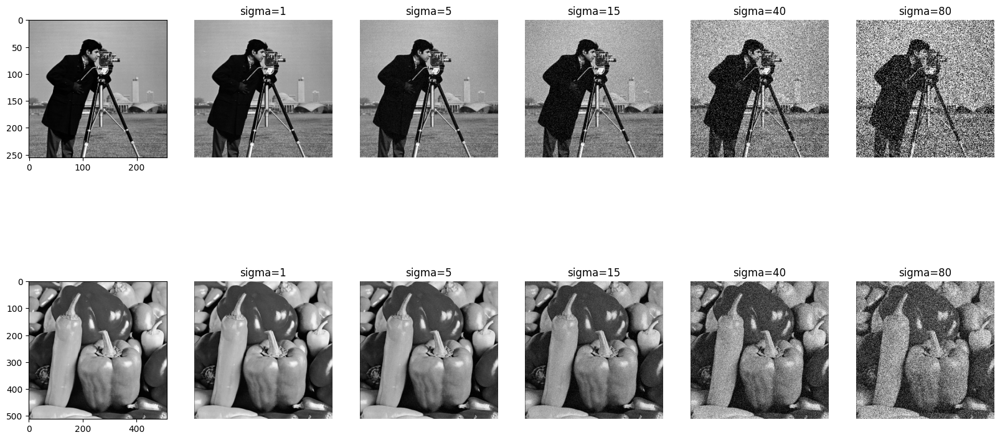

In [ ]:
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np

image1 = cv.imread("Lab2zdjecia/Cameraman.tif", cv.IMREAD_UNCHANGED)
image_gray1 = cv.cvtColor(image1, cv.COLOR_RGB2GRAY)

image2 = cv.imread("Lab2zdjecia/PeppersRGB.tif", cv.IMREAD_UNCHANGED)
image_gray2 = cv.cvtColor(image2, cv.COLOR_RGB2GRAY)


def add_gaussian_noise(image, sigma):
    noise = np.random.normal(0, sigma, image.shape)
    noisy_image = image + noise
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)
    return noisy_image

sigmas = [1, 5, 15, 40, 80]

plt.figure(figsize=(20, 10))
plt.subplot(2,6,1)
plt.imshow(image_gray1, cmap='gray')

plt.subplot(2,6,7)
plt.imshow(image_gray2, cmap='gray')

for i, sigma in enumerate(sigmas):
    noisy_image1 = add_gaussian_noise(image_gray1, sigma)
    plt.subplot(2,6,i+2)
    plt.axis('off')
    plt.title(f'sigma={sigma}')
    plt.imshow(noisy_image1, cmap='gray')

    noisy_image2 = add_gaussian_noise(image_gray2, sigma)
    plt.subplot(2,6,i+8)
    plt.axis('off')
    plt.title(f'sigma={sigma}')
    plt.imshow(noisy_image2, cmap='gray')


Opisz swoje spostrzeżenia

Przy niższych wartościach $\sigma$ (np. 1 lub 5) szczegóły są lepiej zachowane, a szum jest praktycznie niewidoczny. Przy wyższych wartościach (np. 40 lub 80) szum staje się coraz bardziej uciążliwy, a drobne szczegóły są coraz mnie zauważalne.

### b) Szum Poissona   
  
  Szum Poissona jest otrzymywany przez zastąpienie wartości oryginalnej $f_{ij}$ przez wartość losową o rozkładzie Poissona.  

Należy dodać szum Poissona do 2 wybranych obrazów sla 5 różnych wartości parametru $λ$.

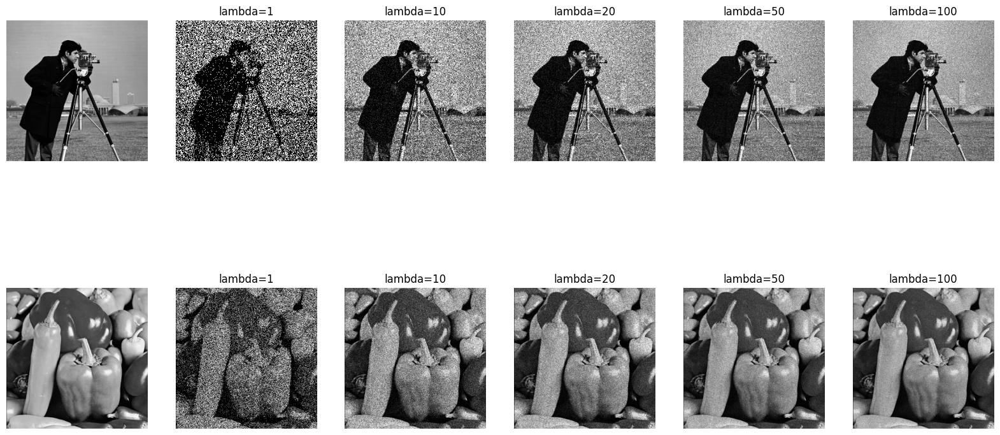

In [99]:
def add_poisson_noise(image, lam):
    image = image.astype(float) / 255.0
    noisy = np.random.poisson(image * lam) / lam 
    noisy_image = np.clip(noisy * 255.0, 0, 255).astype(np.uint8) 
    return noisy_image

lambdas = [1, 10, 20, 50, 100]

plt.figure(figsize=(20, 10))
plt.subplot(2,6,1)
plt.axis('off')
plt.imshow(image_gray1, cmap='gray')

plt.subplot(2,6,7)
plt.axis('off')
plt.imshow(image_gray2, cmap='gray')


for i, l in enumerate(lambdas):
    noisy_image1 = add_poisson_noise(image_gray1, l)
    plt.subplot(2,6,i+2)
    plt.axis('off')
    plt.title(f'lambda={l}')
    plt.imshow(noisy_image1, cmap='gray')

    noisy_image2 = add_poisson_noise(image_gray2, l)
    plt.subplot(2,6,i+8)
    plt.axis('off')
    plt.title(f'lambda={l}')
    plt.imshow(noisy_image2, cmap='gray')


Opisz swoje spostrzeżenia

W mniejszych wartościach $\lambda$ (np. 1) szum jest bardziej widoczny w ciemniejszych obszarach obrazu. W miarę zwiększania $\lambda$ szum rozkłada się równomierniej na całym obrazie. Szum może maskować drobne szczegóły, jednak dla wyższych wartości (np. 50 lub 100), choć szum jest intensywny, szczegóły obrazu są mniej zaburzone.

### c) Szum Salt and Pepper. 
  
Szum w którym określona ilość pikselii jest zamieniana według rozkładu jednostajnego i ich wartość $f_{ij}$ jest zamieniana na 0 (czarny) lub biały (255) z prawdopodobieństwem $\frac{1}{2}$.  
  
Należy dodać szum Salt and Pepper do 2 wybranych obrazów dla 5%, 15%, 25%, 35% i 50% pikseli zamienionych na biały i/lub czarny.  


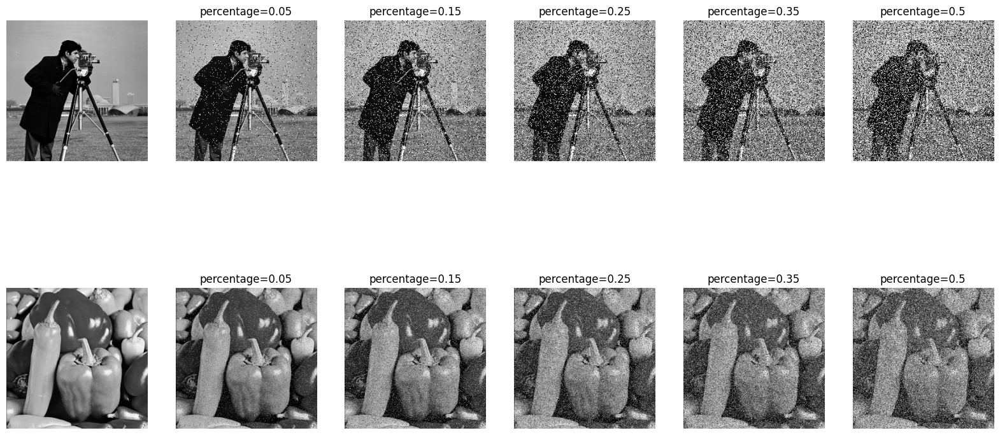

In [100]:
def add_salt_and_pepper_noise(image, percentage):
    PROBABILITY = .5
    noisy_image = image.copy()
    num_pixels = int(percentage * image.size)
    
    coords = [np.random.randint(0, i, num_pixels) for i in image.shape]
    
    for i in range(num_pixels):
        if np.random.rand() < PROBABILITY:
            noisy_image[coords[0][i], coords[1][i]] = 0
        else:
            noisy_image[coords[0][i], coords[1][i]] = 255
    return noisy_image

plt.figure(figsize=(20, 10))
plt.subplot(2,6,1)
plt.axis('off')
plt.imshow(image_gray1, cmap='gray')

plt.subplot(2,6,7)
plt.axis('off')
plt.imshow(image_gray2, cmap='gray')

percentages = [0.05, 0.15, 0.25, 0.35, 0.50]

for i, percentage in enumerate(percentages):
    noisy_image1 = add_salt_and_pepper_noise(image_gray1, percentage)
    plt.subplot(2,6,i+2)
    plt.axis('off')
    plt.title(f'percentage={percentage}')
    plt.imshow(noisy_image1, cmap='gray')

    noisy_image2 = add_salt_and_pepper_noise(image_gray2, percentage)
    plt.subplot(2,6,i+8)
    plt.axis('off')
    plt.title(f'percentage={percentage}')
    plt.imshow(noisy_image2, cmap='gray')


Opisz swoje spostrzeżenia

Szum jest losowo rozproszony na całym obrazie, powodując efekt „ziarnistości”. Wartości od 25% zaszumionych pikseli zaczynają znacząco wpływać na percepcję obrazu.

## Zadanie 2 - Filtrowanie 

Dla obrazów otrymanyh w zadaniu 1 oraz obrazu stworzonego na pierwszym laboratorium (obraz z liniami z dodanym szumem) wykonaj poniższe zadania. 
  
### a) Filtr Butterworth. 
  
Zastosuj filrt Butterworth do wszystkich obrazów

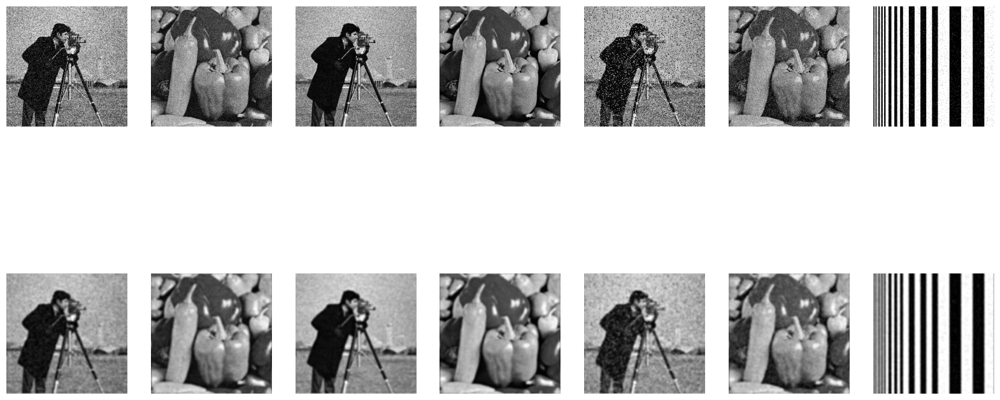

In [101]:
lines = cv.imread('Lab2zdjecia/lines_noise.png')
lines_gray = cv.cvtColor(lines, cv.COLOR_RGB2GRAY)

def butterworth_filter(image, cutoff, order):
    if image.max() > 1:
        image = image / 255.0

    dft = np.fft.fft2(image)
    dft_shift = np.fft.fftshift(dft)
    
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    x, y = np.ogrid[:rows, :cols]
    distance = np.sqrt((x - crow)**2 + (y - ccol)**2)
    filter_mask = 1 / (1 + (distance / cutoff)**(2 * order))
    
    filtered_dft = dft_shift * filter_mask
    dft_ishift = np.fft.ifftshift(filtered_dft)
    filtered_image = np.abs(np.fft.ifft2(dft_ishift))
    
    return np.clip(filtered_image, 0, 1)

sigma = 40
l = 50
percentage = .15
cutoff = 30
order = 2
noisy_images = [add_gaussian_noise(image_gray1, sigma), add_gaussian_noise(image_gray2, sigma), add_poisson_noise(image_gray1, l), add_poisson_noise(image_gray2, l), add_salt_and_pepper_noise(image_gray1, percentage), add_salt_and_pepper_noise(image_gray2, percentage), lines_gray]
filtered_images = [butterworth_filter(image, cutoff, order) for image in noisy_images]


plt.figure(figsize=(20, 10))
for i, (noisy, filtered) in enumerate(zip(noisy_images, filtered_images)):
    plt.subplot(2,7,i+1)
    plt.axis('off')
    plt.imshow(noisy, cmap='gray')

    plt.subplot(2,7,i+8)
    plt.axis('off')
    plt.imshow(filtered, cmap='gray')


Opisz swoje spostrzeżenia

Filtr redukuje szum kosztem utraty krawędzi. Najgorzej radzi sobie z szumem salt and pepper.

### b) Filtr Gaussowski. 
  
Zastosuj filrt Gaussowski do wszystkich obrazów dla 3 różnych warotści $σ$

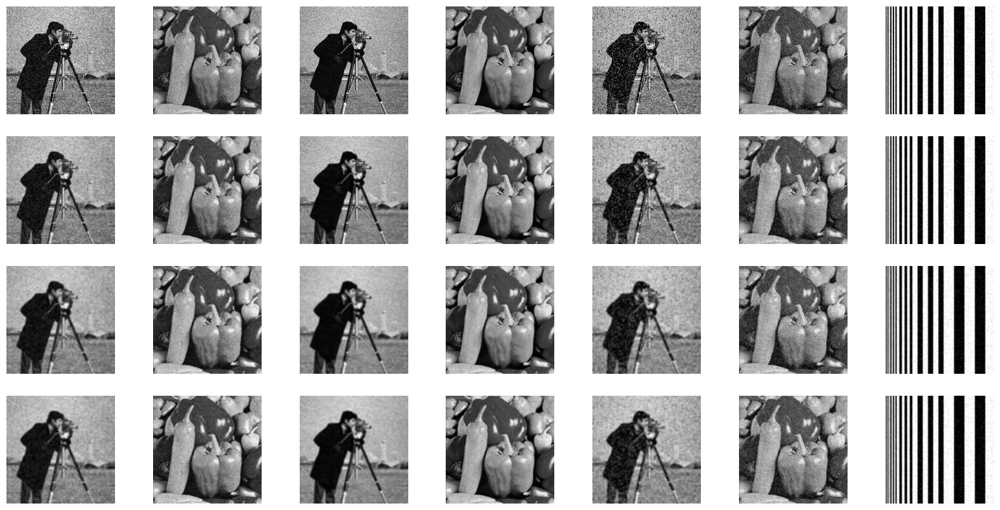

In [115]:
def gaussian_filter(image, sigma):
    return cv.GaussianBlur(image, (5,5), sigma)

l = .9
percentage = .15
cutoff = 30

gauss_1 = [gaussian_filter(image, 1) for image in noisy_images]
gauss_2 = [gaussian_filter(image, 10) for image in noisy_images]
gauss_3 = [gaussian_filter(image, 40) for image in noisy_images]


plt.figure(figsize=(20, 10))

for i, (noisy, filtered1, filtered2, filtered3) in enumerate(zip(noisy_images, gauss_1, gauss_2, gauss_3)):
    plt.subplot(4,7,i+1)
    plt.axis('off')
    plt.imshow(noisy, cmap='gray')

    plt.subplot(4,7,i+8)
    plt.axis('off')
    plt.imshow(filtered1, cmap='gray')

    plt.subplot(4,7,i+15)
    plt.axis('off')
    plt.imshow(filtered2, cmap='gray')

    plt.subplot(4,7,i+22)
    plt.axis('off')
    plt.imshow(filtered3, cmap='gray')


Niskie wartości $\sigma$ powodują niewielkie wygładzenie, idealne do redukcji drobnego szumu przy zachowaniu szczegółów. Wyższe wartości wprowadzają widoczne rozmycie, co pomaga w redukcji szumu kosztem nieco zamazanych krawędzi.
Natomiast wartości $\sigma=40$ powodują nadmierne rozmycie, znaczącą utratę detali i krawędzi.

### c) Filtr Medianowy. 
  
Zastosuj filrt Medianowy do wszystkich obrazów dla 3 wartości okna (5x5, 11x11, 21x21)

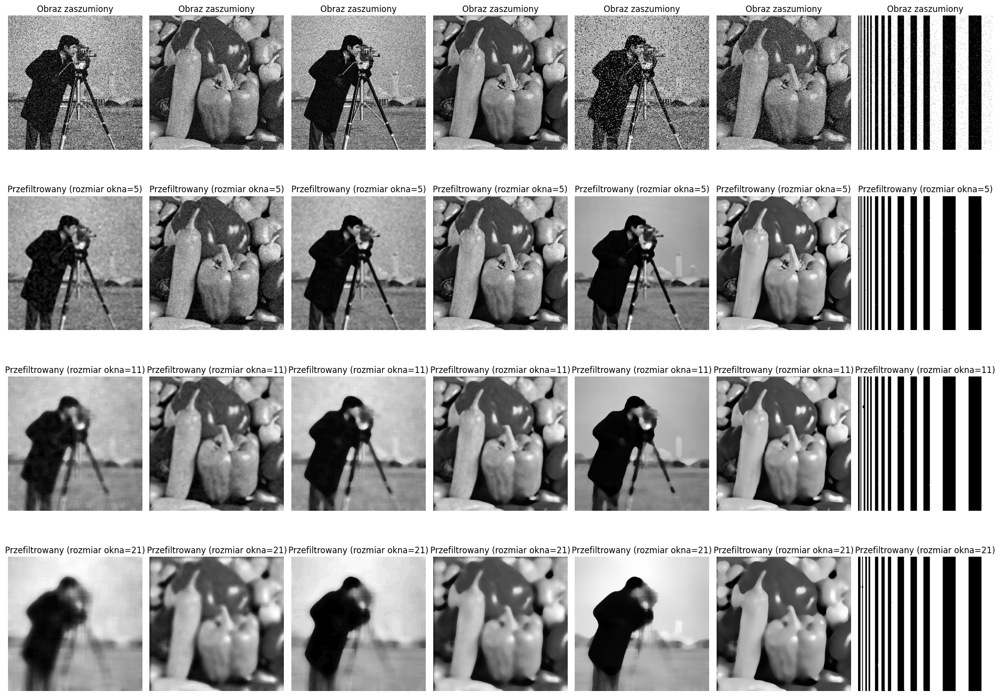

In [117]:
def apply_median_filter(image, ksize):
    return cv.medianBlur(image.astype(np.uint8), ksize)

window_sizes = [5, 11, 21]
filtered_images = {
    ksize: [apply_median_filter(image, ksize) for image in noisy_images]
    for ksize in window_sizes
}

plt.figure(figsize=(20, 15))

for i, noisy in enumerate(noisy_images):
    plt.subplot(len(window_sizes) + 1, len(noisy_images), i + 1)
    plt.imshow(noisy, cmap='gray')
    plt.title(f"Obraz zaszumiony")
    plt.axis('off')

for idx, ksize in enumerate(window_sizes):
    for i, filtered in enumerate(filtered_images[ksize]):
        plt.subplot(len(window_sizes) + 1, len(noisy_images), (idx + 1) * len(noisy_images) + i + 1)
        plt.imshow(filtered, cmap='gray')
        plt.title(f"Przefiltrowany (rozmiar okna={ksize})")
        plt.axis('off')

plt.tight_layout()

Opisz swoje spostrzeżenia. Czy wszystkie filtry tak samo zachowują krawęzie? 

Filtr Butterworth najbardziej wygładza krawędzie. Filtr Gaussowski osiąga podobne efekty w redukcji szumu co Butterworth przy lepszym zachowaniu krawędzi. Filtr medianowy najlepiej radzi sobie z zachowaniem krawędzi, co szczególnie widać na obrazach zaszumionych szumem salt and pepper. Jednak przy większych rozmiarach okna obraz również staje się zbyt wygładzony.

## Zadanie 3 - Wyznaczanie krawędzi

Trzy dowolne obrazy pozyskane w trakcie laboratorium 2 zamień na obrazy monochromatyczne, a następnie wykonaj poniższe polecenia. 

### a) Detekcja krawędzi metodą Sobela. 
  
Zastosuj filtr Sobela do wybranych obrazów

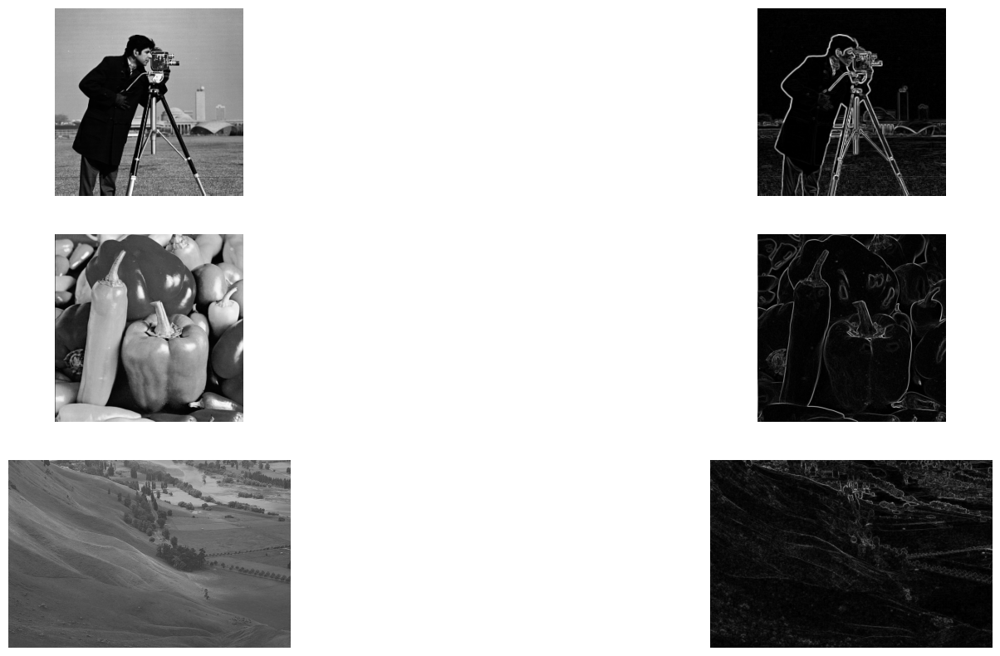

In [104]:
image3 = cv.imread('Lab2Zdjecia/lab5a.jpg')
image_gray3 = cv.cvtColor(image3, cv.COLOR_BGR2GRAY)

def sobel(image):
    grad_x = cv.Sobel(image, cv.CV_64F, 1, 0, ksize=3)
    grad_y = cv.Sobel(image, cv.CV_64F, 0, 1, ksize=3)
    magnitude = cv.magnitude(grad_x, grad_y)
    magnitude = cv.normalize(magnitude, None, 0, 255, cv.NORM_MINMAX)
    return np.uint8(magnitude)

images = [image_gray1, image_gray2, image_gray3]
sobels = [sobel(image) for image in images]

plt.figure(figsize=(20,10))

for i, (im, filtered) in enumerate(zip(images, sobels)):
    plt.subplot(3, 2, 2 * i + 1)
    plt.axis('off')
    plt.imshow(im, cmap='gray')

    plt.subplot(3, 2, 2 * i + 2)
    plt.axis('off')
    plt.imshow(filtered, cmap='gray')

### b) Detekcja krawędzi metodą Laplace'a. 
  
Zastosuj filtr Laplace'a do wybranych obrazów

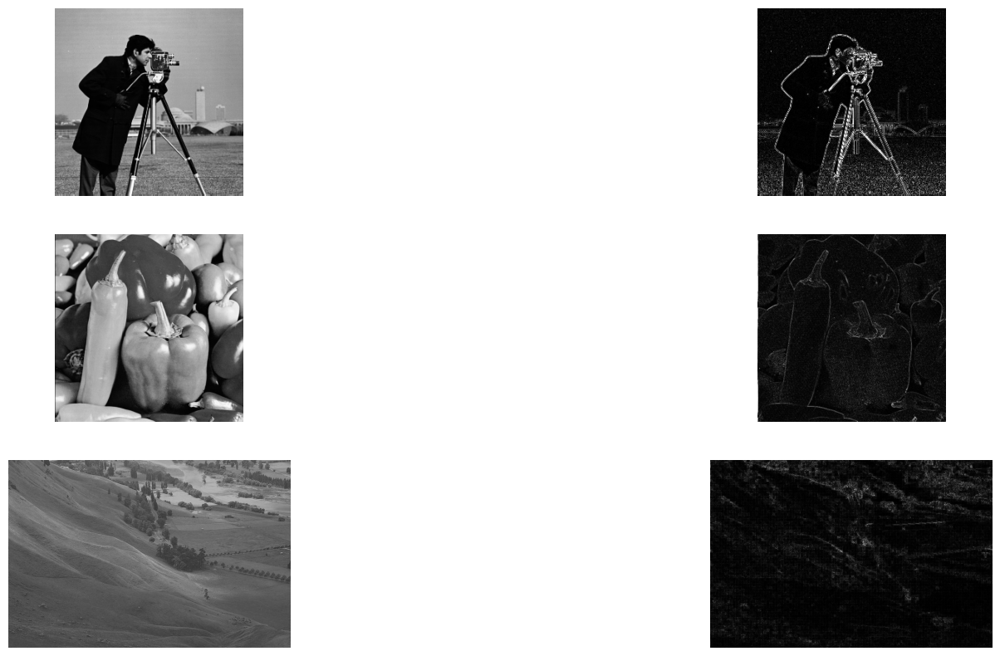

In [105]:
def laplacian(image):
    laplacian = cv.Laplacian(image, cv.CV_64F)
    return cv.convertScaleAbs(laplacian)

laplacians = [laplacian(image) for image in images]

plt.figure(figsize=(20,10))

for i, (im, filtered) in enumerate(zip(images, laplacians)):
    plt.subplot(3, 2, 2 * i + 1)
    plt.axis('off')
    plt.imshow(im, cmap='gray')

    plt.subplot(3, 2, 2 * i + 2)
    plt.axis('off')
    plt.imshow(filtered, cmap='gray')


### c) Detekcja krawędzi metodą Canny'ego. 
  
Zastosuj filtr Canne'ego do wybranych obrazów

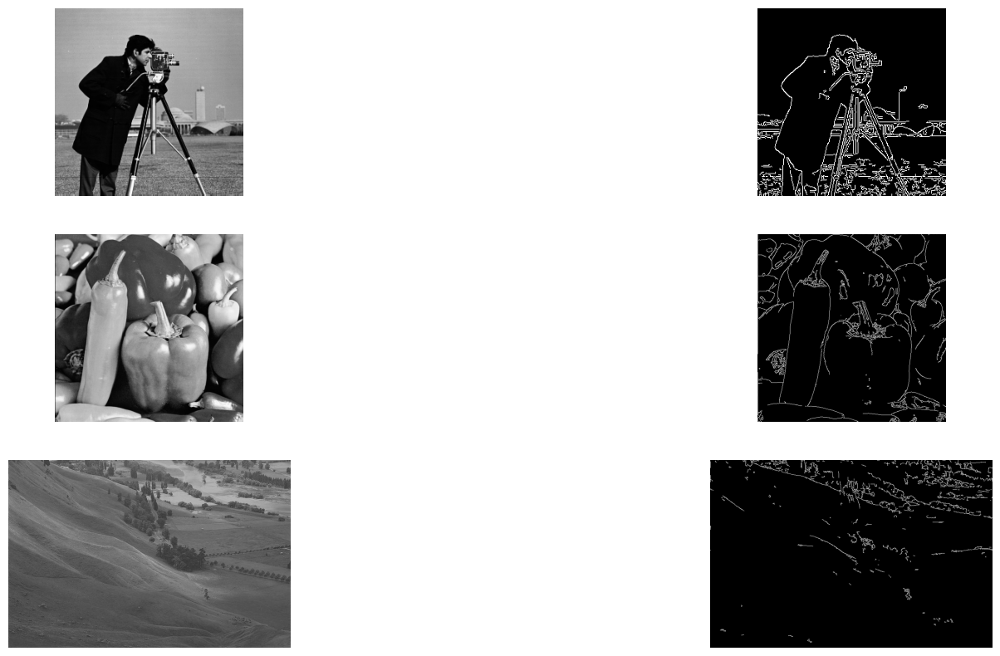

In [106]:
def canny(image, threshold1=100, threshold2=200):
    return cv.Canny(image, threshold1, threshold2)

cannys = [canny(image) for image in images]

plt.figure(figsize=(20,10))

for i, (im, filtered) in enumerate(zip(images, cannys)):
    plt.subplot(3, 2, 2 * i + 1)
    plt.axis('off')
    plt.imshow(im, cmap='gray')

    plt.subplot(3, 2, 2 * i + 2)
    plt.axis('off')
    plt.imshow(filtered, cmap='gray')

Opisz swoje spostrzeżenia po porównaniu 3 metod wyznaczania krawędzi.

* Metoda Sobela - Dobrze wychwytuje zmiany intensywności, ale jest mniej dokładna w porównaniu z pozostałymi metodami.

* Metoda Laplaca - Uniwersalna, ale może generować wiele fałszywych krawędzi bez odpowiedniego zarządzania szumem.

* Metoda Cannego - Najbardziej dokładna przy zachowaniu wyraźnych krawędzi.